In [1]:
from shapely.geometry import Point
import requests
from IPython.display import Image
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import requests
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from IPython.display import Image
import pickle
import numpy as np
import pyproj
from geopy.extra.rate_limiter import RateLimiter
from geopy.geocoders import Nominatim
import time

%matplotlib inline

In [2]:
Income_Bank = pd.read_csv('../data/Income_and_Bankruptcy.csv')
Schools = gpd.read_file('../data/Schools.geojson')

In [3]:
# Bring in the TIGER file:
counties = gpd.read_file('../data/tn_counties/tncounty.shp')
print(counties.crs)
counties.head()

epsg:2274


,OBJECTID,NAME,KEY,SHAPE_AREA,SHAPE_LEN,geometry
0,76,Chester,47023,8.049024e+09,520461.080124,"POLYGON ((1137985.762 344601.643, 1137965.070 ..."
1,77,Wayne,47181,2.050741e+10,666520.678598,"POLYGON ((1365052.057 391716.806, 1365746.554 ..."
2,78,Tipton,47167,1.319125e+10,865093.887634,"MULTIPOLYGON (((886814.330 400456.525, 886774...."
3,79,Hamilton,47065,1.604776e+10,652926.001078,"POLYGON ((2274954.438 239788.911, 2274090.610 ..."
4,80,Stewart,47161,1.375003e+10,490090.336180,"POLYGON ((1382472.783 743972.302, 1382445.171 ..."


In [4]:
counties.shape

(95, 6)

In [5]:
Income_Bank.head(5)

,Feature ID,Median Household Income,Median Earnings - Total,Per Capita Income,Total Population,County,State,County Code,Chapter 7,Chapter 13,Total Individual,Per Capita Individual
0,country:us/state:tn/county:shelby,51657,31571,30104,936374,Shelby,TN,47157,1572,3951,5523,589.828423
1,country:us/state:tn/county:van_buren,42724,25704,20634,5760,Van Buren,TN,47175,2,4,6,104.166667
2,country:us/state:tn/county:madison,48161,30875,26722,97625,Madison,TN,47113,106,233,339,347.247119
3,country:us/state:tn/county:clay,32167,24781,18983,7654,Clay,TN,47027,14,3,17,222.106088
4,country:us/state:tn/county:sequatchie,49370,27602,23050,14816,Sequatchie,TN,47153,20,27,47,317.224622


In [6]:
len(list(Income_Bank['County'].unique()))

95

In [7]:
tennessee = pd.merge(left = counties, right = Income_Bank,
                    left_on = 'NAME', right_on = 'County')
tennessee.head()

,OBJECTID,NAME,KEY,SHAPE_AREA,SHAPE_LEN,geometry,Feature ID,Median Household Income,Median Earnings - Total,Per Capita Income,Total Population,County,State,County Code,Chapter 7,Chapter 13,Total Individual,Per Capita Individual
0,76,Chester,47023,8.049024e+09,520461.080124,"POLYGON ((1137985.762 344601.643, 1137965.070 ...",country:us/state:tn/county:chester,51946,31434,22629,17190,Chester,TN,47023,14,38,52,302.501454
1,77,Wayne,47181,2.050741e+10,666520.678598,"POLYGON ((1365052.057 391716.806, 1365746.554 ...",country:us/state:tn/county:wayne,41427,25794,20689,16693,Wayne,TN,47181,10,8,18,107.829629
2,78,Tipton,47167,1.319125e+10,865093.887634,"MULTIPOLYGON (((886814.330 400456.525, 886774....",country:us/state:tn/county:tipton,61291,34976,28457,61447,Tipton,TN,47167,90,126,216,351.522450
3,79,Hamilton,47065,1.604776e+10,652926.001078,"POLYGON ((2274954.438 239788.911, 2274090.610 ...",country:us/state:tn/county:hamilton,55070,32668,32839,360919,Hamilton,TN,47065,568,715,1283,355.481424
4,80,Stewart,47161,1.375003e+10,490090.336180,"POLYGON ((1382472.783 743972.302, 1382445.171 ...",country:us/state:tn/county:stewart,45809,28410,24113,13427,Stewart,TN,47161,18,8,26,193.639681


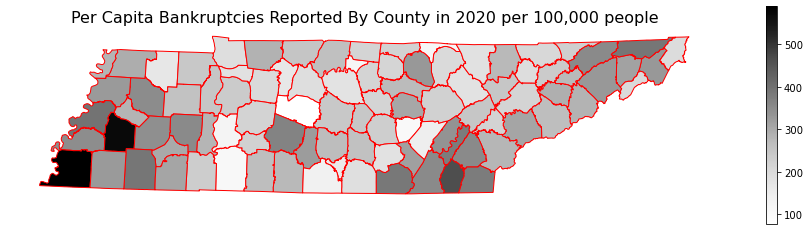

In [8]:
fig, ax = plt.subplots(figsize=(16,4))
tennessee.plot(column = 'Per Capita Individual',
               cmap = 'Greys',
               edgecolor = 'red',
                legend = True,
              ax = ax)
plt.title('Per Capita Bankruptcies Reported By County in 2020 per 100,000 people', fontsize = 16)
ax.axis('off');

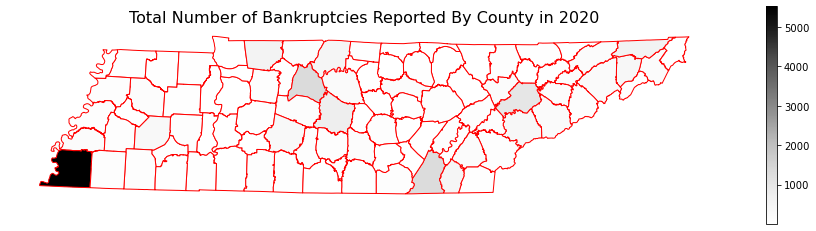

In [9]:
fig, ax = plt.subplots(figsize=(16,4))
tennessee.plot(column = 'Total Individual',
               cmap = 'Greys',
               edgecolor = 'red',
                legend = True,
              ax = ax)
plt.title('Total Number of Bankruptcies Reported By County in 2020', fontsize = 16)
ax.axis('off');

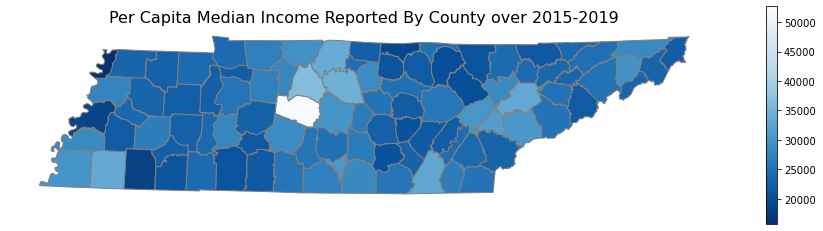

In [60]:
fig, ax = plt.subplots(figsize=(16,4))
tennessee.plot(column = 'Per Capita Income',
               cmap = 'Blues_r',
               edgecolor = 'grey',
                legend = True,
              ax = ax)
plt.title('Per Capita Median Income Reported By County over 2015-2019', fontsize = 16)
ax.axis('off');

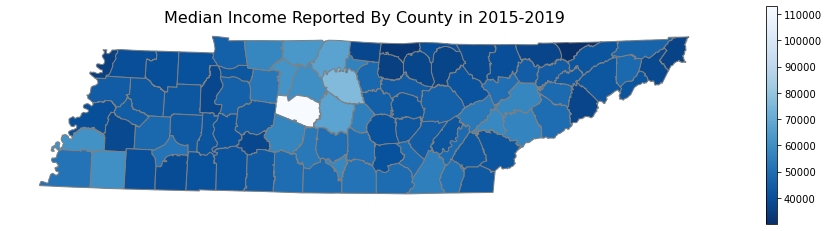

In [61]:
fig, ax = plt.subplots(figsize=(16,4))
tennessee.plot(column = 'Median Household Income',
               cmap = 'Blues_r',
               edgecolor = 'grey',
                legend = True,
              ax = ax)
plt.title('Median Income Reported By County in 2015-2019', fontsize = 16)
ax.axis('off');

In [12]:
counties = counties.to_crs('EPSG:4326')

In [13]:
counties.head(5)

,OBJECTID,NAME,KEY,SHAPE_AREA,SHAPE_LEN,geometry
0,76,Chester,47023,8.049024e+09,520461.080124,"POLYGON ((-88.78177 35.24759, -88.78185 35.247..."
1,77,Wayne,47181,2.050741e+10,666520.678598,"POLYGON ((-88.02474 35.39231, -88.02237 35.390..."
2,78,Tipton,47167,1.319125e+10,865093.887634,"MULTIPOLYGON (((-89.62931 35.37836, -89.62944 ..."
3,79,Hamilton,47065,1.604776e+10,652926.001078,"POLYGON ((-84.97698 34.98767, -84.97986 34.987..."
4,80,Stewart,47161,1.375003e+10,490090.336180,"POLYGON ((-87.99034 36.36078, -87.99044 36.360..."


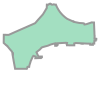

In [14]:
counties.loc[0, 'geometry']

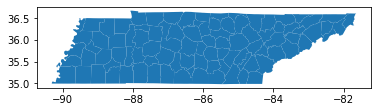

In [15]:
counties.plot();

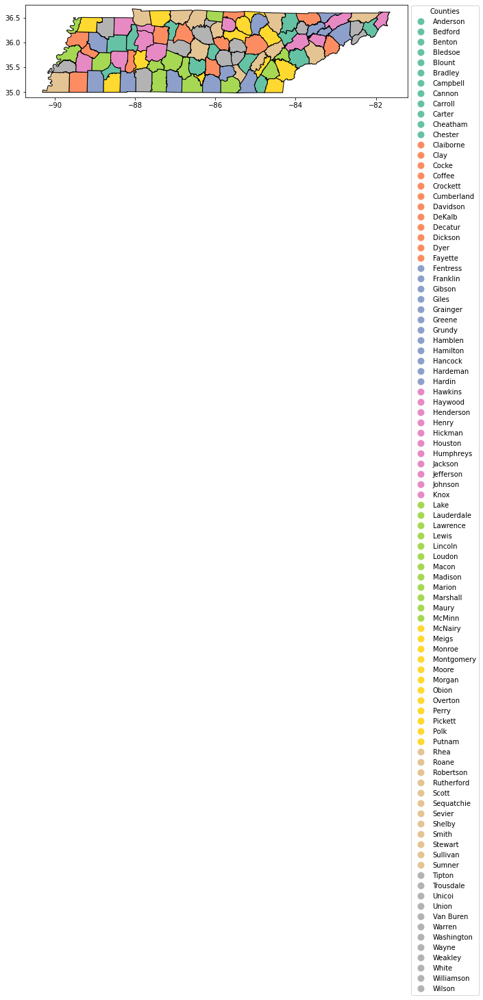

In [16]:
#geopandas handles legend styling if you pass a dict of keywords

leg_kwds = {'title': 'Counties', 'loc': 'upper left', 
            'bbox_to_anchor': (1, 1.03), 'ncol': 1}

counties.plot(column = 'NAME', figsize=(10, 10),
              edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, 
              cmap = 'Set2')
plt.show()

In [17]:
School_geo = gpd.GeoDataFrame(Schools,
                             crs = counties.crs,
                             geometry = Schools['geometry'])

In [18]:
type(School_geo)

geopandas.geodataframe.GeoDataFrame

In [19]:
Schools_by_county = gpd.sjoin(School_geo, counties, op = 'within')

In [20]:
Schools_by_county.head(5)

,Region,District No,District,School No,Type,County,School,Email,Title,Status,...,ADDRESS,lng,lat,geometry,index_right,OBJECTID,NAME,KEY,SHAPE_AREA,SHAPE_LEN
0,SOUTHWEST CORE REGIONAL OFFICE,9570,MADISON COUNTY PRIVATE SCHOOLS,9705,Private,Madison,5 Point Learning Academy,None,Principal: Sherri Yetto,A,...,"203 Harts Bridge RD, Jackson, TN 38301",-83.965596,36.009815,POINT (-83.96560 36.00982),35,40,Knox,47093,1.465816e+10,742652.020061
11,EAST TENNESSEE CORE REGIONAL OFFICE,9470,KNOX COUNTY PRIVATE SCHOOLS,9380,Private,Knox,Antioch Baptist Christian Academy,administration@antiochbaptistchristianacademy.org,Principal: Nathaniel Morris,A,...,"5709 North Broadway, Knoxville, TN 37918",-83.928461,36.048167,POINT (-83.92846 36.04817),35,40,Knox,47093,1.465816e+10,742652.020061
15,EAST TENNESSEE CORE REGIONAL OFFICE,9470,KNOX COUNTY PRIVATE SCHOOLS,9375,Private,Knox,Apostolic Christian School,acs@facknoxville.com,Principal: Carolyn Daniel,A,...,"5020 Pleasant Ridge RD, Knoxville, TN 37912",-83.993263,35.988168,POINT (-83.99326 35.98817),35,40,Knox,47093,1.465816e+10,742652.020061
23,EAST TENNESSEE CORE REGIONAL OFFICE,470,KNOX COUNTY,9,Public,Knox,Austin East High/Magnet,nathan.langlois@knoxschools.org,Principal: Nathan Langlois,A,...,"2800 M L King Jr AVE, Knoxville, TN 37914",-83.885069,35.988775,POINT (-83.88507 35.98877),35,40,Knox,47093,1.465816e+10,742652.020061
32,EAST TENNESSEE CORE REGIONAL OFFICE,470,KNOX COUNTY,17,Public,Knox,Bearden High School,debbie.sayers@knoxschools.org,Principal: Debbie Sayers,A,...,"8352 Kingston PIKE, Knoxville, TN 37919",-84.056999,35.919853,POINT (-84.05700 35.91985),35,40,Knox,47093,1.465816e+10,742652.020061


In [21]:
Schools_by_county['NAME'].value_counts()

Shelby        109
Davidson       82
Knox           50
Hamilton       45
Rutherford     28
             ... 
Hardin          3
Decatur         3
Pickett         3
Lake            3
Moore           2
Name: NAME, Length: 95, dtype: int64

In [22]:
Public = Schools_by_county.loc[Schools_by_county['Type'] == 'Public']
Public.shape

(418, 23)

In [23]:
Private = Schools_by_county.loc[Schools_by_county['Type'] == 'Private']
Private.shape

(342, 23)

In [24]:
Homeschool = Schools_by_county.loc[Schools_by_county['Type'] == 'Home School']
Homeschool.shape

(131, 23)

In [25]:
Homebound = Schools_by_county.loc[Schools_by_county['Type'] == 'Homebound']
Homebound.shape

(130, 23)

In [26]:
Public_Charter = Schools_by_county.loc[Schools_by_county['Type'] == 'Public Charter']
Public_Charter.shape

(30, 23)

In [27]:
Private_Lauderdale = Private.loc[Private['NAME'] == 'Lauderdale']
Public_Lauderdale = Public.loc[Public['NAME'] == 'Lauderdale']

In [28]:
Private_Hardeman = Private.loc[Private['NAME'] == 'Hardeman']
Public_Hardeman = Public.loc[Public['NAME'] == 'hardeman']

In [29]:
Private_Shelby = Private.loc[Private['NAME'] == 'Shelby']
Public_Shelby = Public.loc[Public['NAME'] == 'Shelby']

In [31]:
polygonLauderdale = counties.loc[counties['NAME'] == 'Lauderdale']
polygonLauderdale.shape

(1, 6)

In [33]:
polygonHardeman = counties.loc[counties['NAME'] == 'Hardeman']
polygonHardeman.shape

(1, 6)

In [34]:
polygonShelby = counties.loc[counties['NAME'] == 'Shelby']
polygonShelby.shape

(1, 6)

In [35]:
polygonLauderdale.geometry.centroid

<ipython-input-35-57c6d362bfe3>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  polygonLauderdale.geometry.centroid


48    POINT (-89.63137 35.76088)
dtype: geometry

In [36]:
polygonHardeman.geometry.centroid

<ipython-input-36-9685ebfb9be1>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  polygonHardeman.geometry.centroid


84    POINT (-88.99308 35.20687)
dtype: geometry

In [37]:
polygonShelby.geometry.centroid

<ipython-input-37-b1f0d15c35e6>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  polygonShelby.geometry.centroid


87    POINT (-89.89515 35.18382)
dtype: geometry

In [38]:
center1 = polygonLauderdale.geometry.centroid[48]

<ipython-input-38-bc4d850d3e88>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center1 = polygonLauderdale.geometry.centroid[48]


In [39]:
center2 = polygonHardeman.geometry.centroid[84]

<ipython-input-39-78390fcc7152>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center2 = polygonHardeman.geometry.centroid[84]


In [40]:
center3 = polygonShelby.geometry.centroid[87]

<ipython-input-40-641fb7e60719>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center3 = polygonShelby.geometry.centroid[87]


In [41]:
area_center1 = [center1.y, center1.x]

In [42]:
area_center2 = [center2.y, center2.x]

In [43]:
area_center3 = [center3.y, center3.x]

In [44]:
map_Lauderdale = folium.Map(location =  area_center1, zoom_start = 10.5)

folium.GeoJson(polygonLauderdale).add_to(map_Lauderdale)

#iterate through Schools in Lauderdale to create locations and markers 
#for each school
#remember for Folium locations, lat is listed first!!
marker_cluster = MarkerCluster().add_to(map_Lauderdale)

for row_index, row_values in Public_Lauderdale.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values[' School'])
    icon=folium.Icon(color="blue",icon="graduation-cap", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(marker_cluster)
    
marker_cluster2 = MarkerCluster().add_to(map_Lauderdale)

for row_index, row_values in Private_Lauderdale.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values[' School'])
    icon=folium.Icon(color="red",icon="graduation-cap", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(marker_cluster)    
map_Lauderdale.save('../maps/mapLauderdale.html')

#display our map
map_Lauderdale

In [45]:
map_Hardeman = folium.Map(location =  area_center2, zoom_start = 10.5)

folium.GeoJson(polygonHardeman).add_to(map_Hardeman)

#iterate through Schools in Hardeman to create locations and markers 
#for each school
#remember for Folium locations, lat is listed first!!
marker_cluster = MarkerCluster().add_to(map_Hardeman)

for row_index, row_values in Public_Hardeman.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values[' School'])
    icon=folium.Icon(color="blue",icon="graduation-cap", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(marker_cluster)
    
marker_cluster3 = MarkerCluster().add_to(map_Hardeman)

for row_index, row_values in Private_Hardeman.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values[' School'])
    icon=folium.Icon(color="red",icon="graduation-cap", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(marker_cluster)    
map_Hardeman.save('../maps/mapHardeman.html')

#display our map
map_Hardeman

In [46]:
map_Shelby = folium.Map(location =  area_center3, zoom_start = 10.5)

folium.GeoJson(polygonShelby).add_to(map_Shelby)

#iterate through Schools in Lauderdale to create locations and markers 
#for each school
#remember for Folium locations, lat is listed first!!
marker_cluster = MarkerCluster().add_to(map_Shelby)

for row_index, row_values in Public_Shelby.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values[' School'])
    icon=folium.Icon(color="blue",icon="graduation-cap", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(marker_cluster)
    
marker_cluster4 = MarkerCluster().add_to(map_Shelby)

for row_index, row_values in Private_Shelby.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values[' School'])
    icon=folium.Icon(color="red",icon="graduation-cap", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(marker_cluster)    
map_Shelby.save('../maps/mapShelby.html')

#display our map
map_Shelby

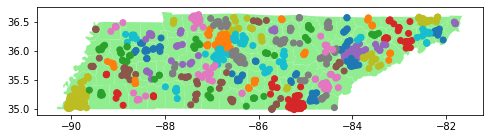

In [47]:
ax = counties.plot(figsize = (8, 10), color = 'lightgreen')
Schools_by_county.plot( ax = ax, column = 'NAME');
plt.show();

In [48]:
#basemap (used state cap. for the lat/long)
TN_base = folium.Map(location = [35.864320444977146, -86.36219096598812], zoom_start = 7, control_scale = True)

folium.GeoJson(counties).add_to(TN_base)
        
#create cluster with Private Schools
marker_cluster = MarkerCluster(name = 'Private Schools').add_to(TN_base)

for row_index, row_values in Private.iterrows():
        loc = row_values['lat'], row_values['lng']
        pop = str(row_values[' School'])
        icon = folium.Icon(color = 'red', prefix = 'fa')
        marker = folium.Marker(location = loc,
                               popup = pop,
                               icon = icon)
        marker.add_to(marker_cluster)
        
#create cluster with Public Schools
marker_cluster1 = MarkerCluster(name = 'Public Schools').add_to(TN_base)

for row_index, row_values in Public.iterrows():
        loc = row_values['lat'], row_values['lng']
        pop = str(row_values[' School'])
        icon = folium.Icon(color = 'blue', icon="graduation-cap", prefix = 'fa')
        marker = folium.Marker(location = loc,
                               popup = pop,
                               icon = icon)
        marker.add_to(marker_cluster)
        
#create cluster with Homeschools
marker_cluster2 = MarkerCluster(name = 'Home Schools').add_to(TN_base)

for row_index, row_values in Homeschool.iterrows():
        loc = row_values['lat'], row_values['lng']
        pop = str(row_values[' School'])
        icon = folium.Icon(color = 'black', icon="graduation-cap", prefix = 'fa')
        marker = folium.Marker(location = loc,
                               popup = pop,
                               icon = icon)
        marker.add_to(marker_cluster)

        #create cluster with Homebound
marker_cluster3 = MarkerCluster(name = 'Homebound Schools').add_to(TN_base)

for row_index, row_values in Homebound.iterrows():
        loc = row_values['lat'], row_values['lng']
        pop = str(row_values[' School'])
        icon = folium.Icon(color = 'black', icon="graduation-cap", prefix = 'fa')
        marker = folium.Marker(location = loc,
                               popup = pop,
                               icon = icon)
        marker.add_to(marker_cluster)

#create cluster with Public Charter
marker_cluster4 = MarkerCluster(name = 'Public Charter').add_to(TN_base)

for row_index, row_values in Public_Charter.iterrows():
        loc = row_values['lat'], row_values['lng']
        pop = str(row_values[' School'])
        icon = folium.Icon(color = 'gray', icon="graduation-cap", prefix = 'fa')
        marker = folium.Marker(location = loc,
                               popup = pop,
                               icon = icon)
        marker.add_to(marker_cluster)
TN_base

In [49]:
folium.Map?

In [50]:
TN_base.save('../maps/School_map.html')

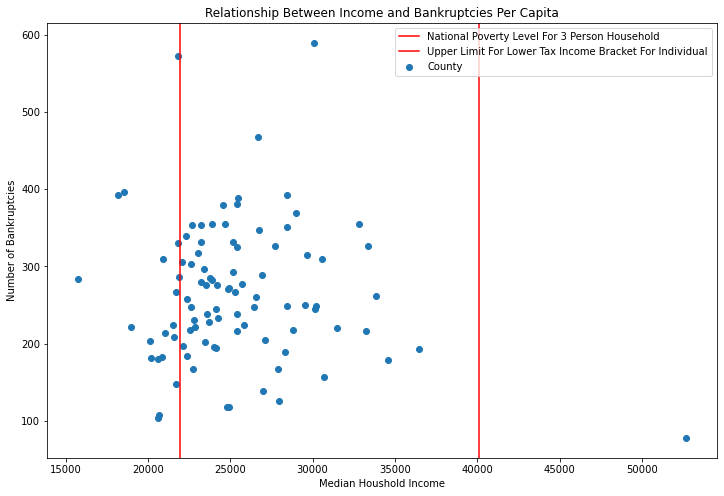

In [59]:
plt.figure(figsize=(12, 8))
plt.scatter(x = 'Per Capita Income', y ='Per Capita Individual', data = Income_Bank, label = 'County')
plt.axvline(x = 21960, color = 'red', label = 'National Poverty Level For 3 Person Household')
plt.axvline(x = 40125, color = 'red', label = 'Upper Limit For Lower Tax Income Bracket For Individual')
plt.xlabel('Median Houshold Income')
plt.ylabel('Number of Bankruptcies')
plt.title('Relationship Between Income and Bankruptcies Per Capita')
plt.legend();

In [ ]:
21960, 40125